In [ ]:
# This continues the first and second interpretability file and is only included here because of the limited size of Github files. The concepts used here are not redefined. 

In [2]:
########## Shapley value (SHAP)


# Import library
import shap

# load JS in order to use some of the plotting functions from the shap package in the notebook
shap.initjs()

# Similarly to LIME, I can explain model prediction for the training set or test set depending on the utility required. 
# In most cases it will be more useful on the test set, especially to answer the 'right to explanation' demand.
# Since it is not really the case here and since we are principally concerned with the building phase of the model for now, we focus on the training set.

# Explain the model's predictions using SHAP values
shap_explainer = shap.TreeExplainer(classifier)
shap_values = shap_explainer.shap_values(X_train)

# Store shap values as probabilities (of customer churn)
from scipy.special import expit
proba_shap_values = expit(shap_values)



### Focus on a single instance 

# Define the sigmoid function
import math
def sigmoid(x):
  return 1 / (1 + math.exp(-x))

# Exact contribution of each feature to the output of instance i. 
i = 10 
for j in range(0, len(features)):
    contribution = (proba_shap_values[i,j]- sigmoid(shap_explainer.expected_value))
    print features[j], (X_train2[features[j]][i]) , 'contribution is '+ str(round(contribution,3))

# Sort by size of contribution
print('')
print('SORTED VERSION')
dict = {}
for j in range(0, len(features)):
    contribution = (proba_shap_values[i,j]- sigmoid(shap_explainer.expected_value))
    dict[features[j]] = round(contribution,3)
# Descending order
for k,v in sorted(dict.items() , key=lambda t : t[1] , reverse=True):
    print k, X_train2[k][i],'contribution: '+ str(v)
    # print k,v
"""
# Ascending order
for key, value in sorted(dict.iteritems(), key=lambda (k,v): (v,k)):
  print "%s: %s" % (key, value)
"""

# Visualize the prediction's explanation for the 10th individual. 
shap.force_plot(shap_explainer.expected_value, shap_values[10,:], X_train2.iloc[10,:])

# Let's express SHAP values as probabilities
shap.force_plot(shap_explainer.expected_value, shap_values[10,:], X_train2.iloc[10,:], link = 'logit')

# The above explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed, mean output of trees) to the model output. 
# Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue

gender 0.0 contribution is 0.0
SeniorCitizen 0.0 contribution is 0.017
Partner 0.0 contribution is 0.009
Dependents 0.0 contribution is 0.025
tenure 2.0 contribution is 0.127
PhoneService 1.0 contribution is 0.007
MultipleLines 1.0 contribution is 0.012
OnlineSecurity 0.0 contribution is 0.031
OnlineBackup 0.0 contribution is 0.024
DeviceProtection 1.0 contribution is -0.012
TechSupport 0.0 contribution is 0.044
StreamingTV 1.0 contribution is 0.023
StreamingMovies 0.0 contribution is -0.03
PaperlessBilling 1.0 contribution is 0.05
MonthlyCharges 91.4 contribution is 0.017
TotalCharges 193.6 contribution is 0.001
InternetService_DSL 0.0 contribution is 0.003
InternetService_Fiber optic 1.0 contribution is 0.066
InternetService_No 0.0 contribution is 0.038
Contract_Month-to-month 1.0 contribution is 0.15
Contract_One year 0.0 contribution is 0.014
Contract_Two year 0.0 contribution is 0.021
PaymentMethod_Bank transfer (automatic) 0.0 contribution is 0.031
PaymentMethod_Credit card (auto

In [19]:
### Global approach 
# Dependence plots, interaction effects, feature importance 

# Visualize the training set predictions' explanations
# If we take many explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally, we can see explanations for an entire dataset.
shap.force_plot(shap_explainer.expected_value, shap_values, X_train2)
# Especially useful for continuous variabels! PLay with it, many possibilities. 

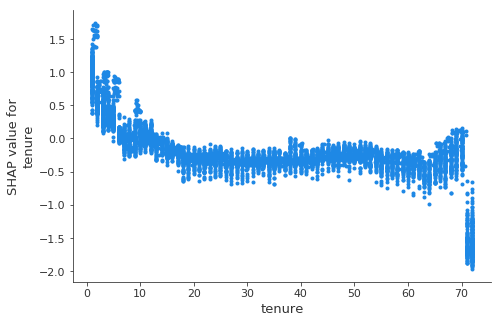

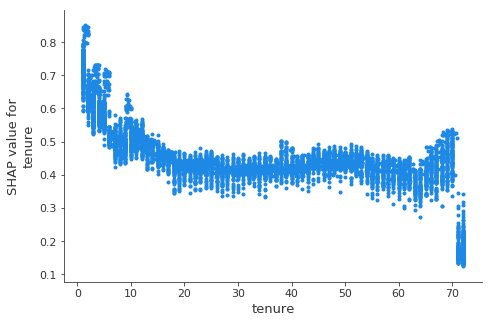

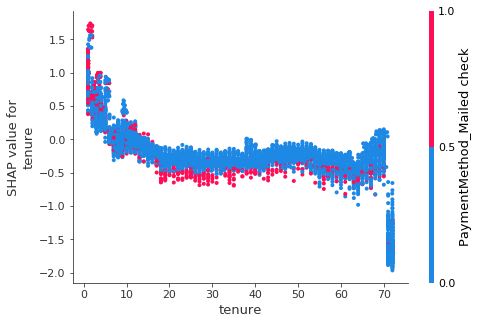

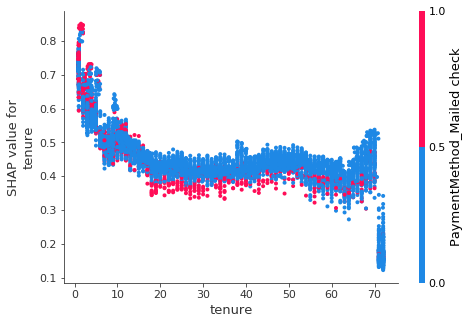

In [20]:
# Create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("tenure", shap_values, X_train2, interaction_index= None)
shap.dependence_plot("tenure", proba_shap_values, X_train2, interaction_index= None)  # as proba

# Same but including interaction effects, meaning without extra dependence with another feature.
shap.dependence_plot("tenure", shap_values, X_train2)
shap.dependence_plot("tenure", proba_shap_values, X_train2) # as proba

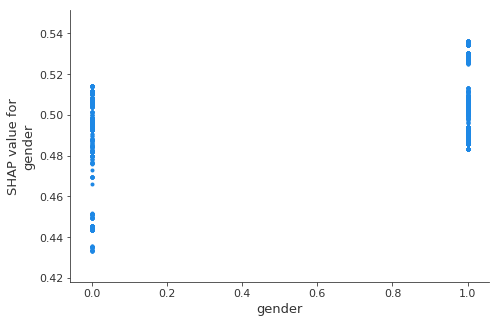

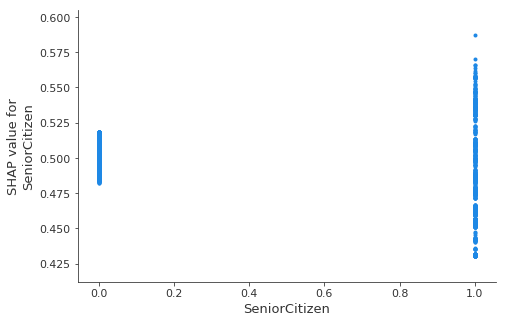

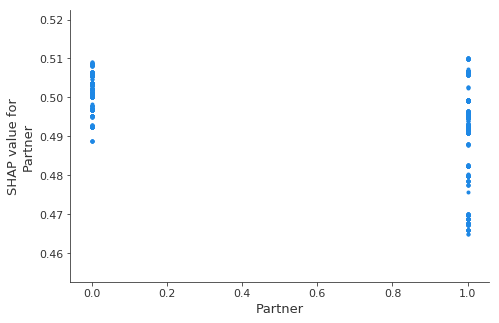

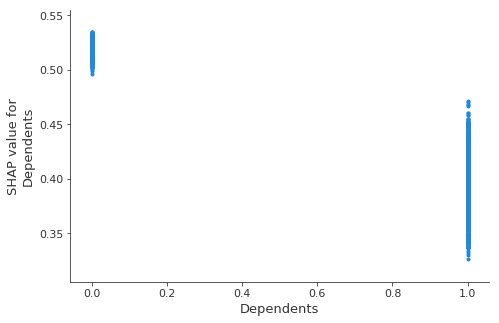

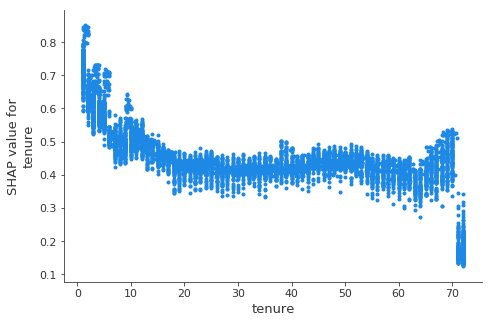

...

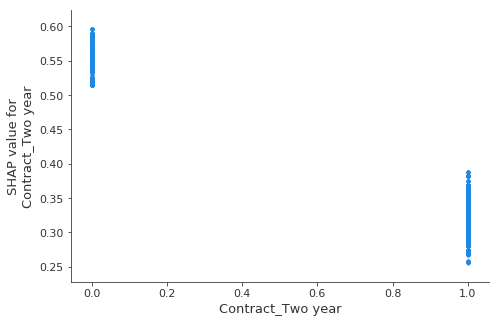

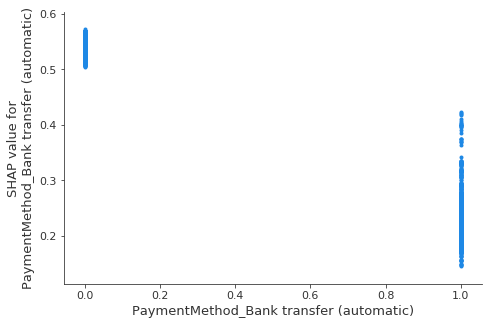

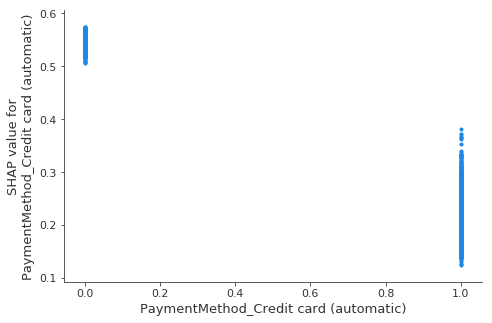

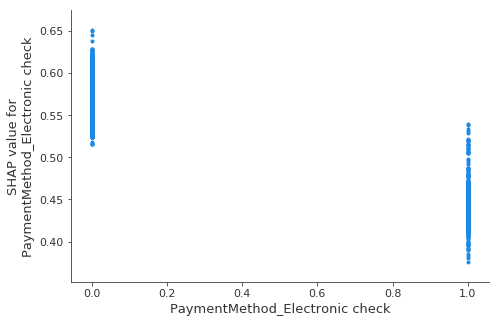

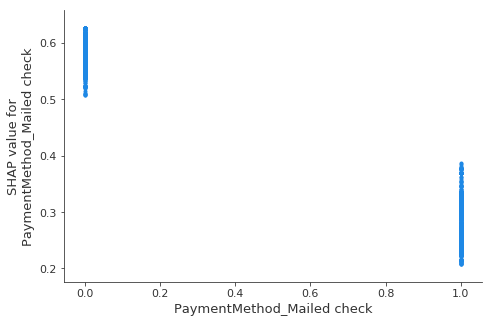

In [24]:
# Similarly, you can replicate the process for all desired features in the dataset. 
for name in features: 
    shap.dependence_plot(name, proba_shap_values, X_train2, interaction_index= None)  # as proba

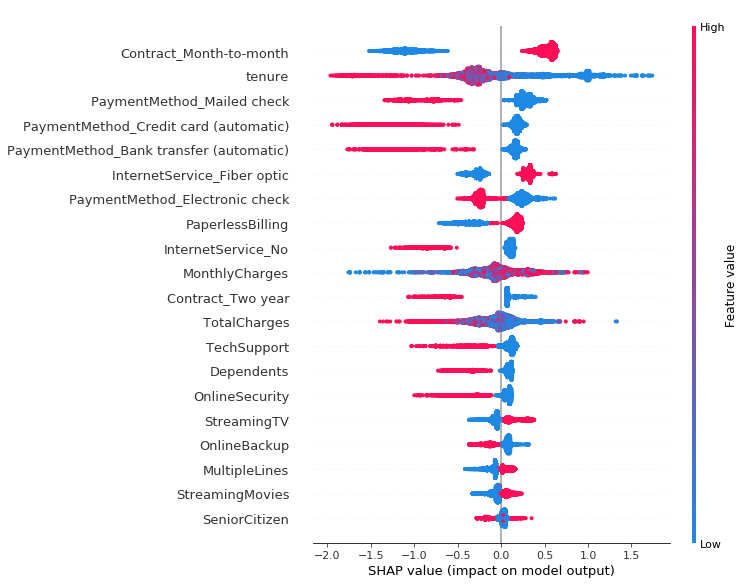

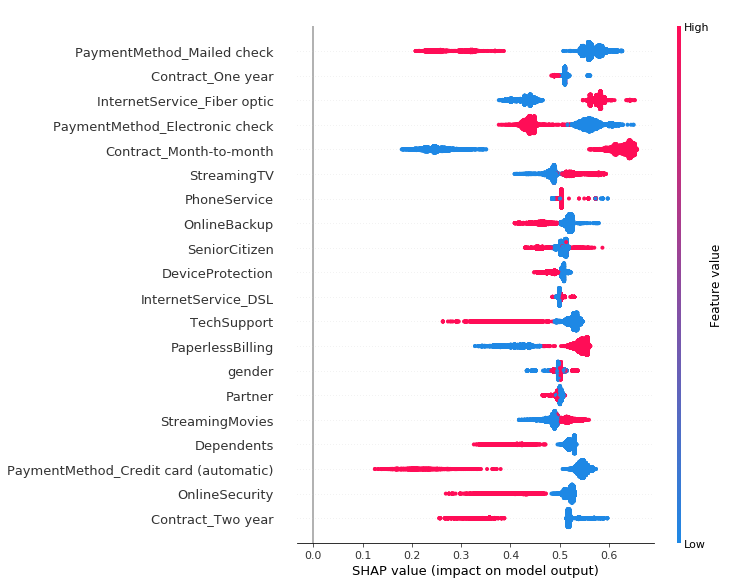

In [21]:
# Summarize the effects of all the features. Can also tell if effects are heterogenous using this plot. 
shap.summary_plot(shap_values, X_train2)
shap.summary_plot(proba_shap_values, X_train2) # as proba
# This plot sorts features by the sum of SHAP value magnitudes over all samples, and uses SHAP values to show the distribution of the impacts each feature has on the model output.


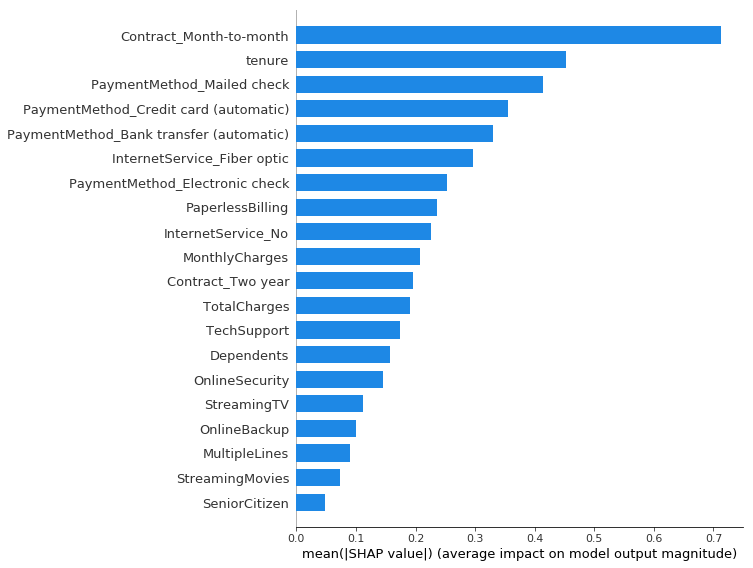

In [3]:
# Feature importance - plot the SHAP values of every feature for all samples. 
# Take the mean absolute value of the SHAP values for each feature to get a standard bar plot
shap.summary_plot(shap_values, X_train2, plot_type="bar")
# As proba, not significant 